# Global IRF Efficiency Map

Generate global map of CDR efficiency using IRF forcing.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import xarray as xr
import matplotlib.pyplot as plt

import atlas

/global/common/software/m4632/conda/cworthy/lib/python3.11/site-packages/pop_tools/__init__.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


## Define experiment and phase



In [3]:
cdr_forcing = "ANTITRACER"
vintage = "001"

In [4]:
#antitracer_config = {
#    "suffix": "test",
#    "date": "1999-01",
#    "experiments": [
#        {"basin": "North_Atlantic_basin", "polygon": 0},
#        {"basin": "North_Atlantic_basin", "polygon": 1},
#        {"basin": "North_Pacific_basin", "polygon": 0},
#        {"basin": "North_Pacific_basin", "polygon": 1},
#        {"basin": "South", "polygon": 0},
#        {"basin": "South", "polygon": 1},
#        {"basin": "Southern_Ocean", "polygon": 1},
#        {"basin": "Southern_Ocean", "polygon": 5},
#    ]
#}
#calc = atlas.global_irf_map(cdr_forcing, vintage, antitracer_config=antitracer_config)

In [5]:
calc = atlas.global_irf_map(cdr_forcing, vintage, antitracer_config="antitracer-configs/antitracer_config_1999-01_all.yaml")

In [6]:
calc.df

,blueprint,polygon,basin,start_date,cdr_forcing,cdr_forcing_files,antitracer_master_indices,simulation_key,refdate,stop_n,wallclock,curtail_output
case,,,,,,,,,,,,
smyle.anti-tracer.glb-antitracer_1999-01_all.001,smyle,None,None,1999-01,ANTITRACER,[/global/cfs/projectdirs/m4746/Projects/OAE-Ef...,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",glb-antitracer_1999-01_all,0347-01-01,12,10:00:00,True


In [7]:
print(calc.df["antitracer_master_indices"].tolist())

[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221

## Table of experiments

## Check status

In [8]:
%%time
df = calc.df_case_status
df

CPU times: user 4.06 ms, sys: 127 μs, total: 4.19 ms
Wall time: 561 ms


,build,submitted,run_completed,archive,error,error_count,timestamp_run,JobId,JobState,Queued,yr_per_day,pe-hr_per_yr
case,,,,,,,,,,,,
smyle.anti-tracer.glb-antitracer_1999-01_all.001,True,False,False,False,False,0,None,None,None,False,NaN,NaN


## Build the model for each experiment

In [9]:
clobber_list = calc.check_cases()
clobber_list

[]

In [10]:
len(clobber_list)

0

In [11]:
phase = "deploy"
clobber = True

In [27]:
calc.build(
    phase=phase, 
    clobber=clobber, 
    clobber_list=clobber_list,
)

Submitted batch job 45342799


In [12]:
%%time
df = calc.df_case_status
df

CPU times: user 13 μs, sys: 1 μs, total: 14 μs
Wall time: 18.6 μs


,build,submitted,run_completed,archive,error,error_count,timestamp_run,JobId,JobState,Queued,yr_per_day,pe-hr_per_yr
case,,,,,,,,,,,,
smyle.anti-tracer.glb-antitracer_1999-01_all.001,True,False,False,False,False,0,None,None,None,False,NaN,NaN


## Run the simulations

In [13]:
n_jobs = calc.compute(
    n_bundle=1, 
    #bundle_queue="debug", 
    #just_these_cases=[
    #    "smyle.anti-tracer.glb-antitracer_1999-01_test.001"
    #]
)

regular


In [14]:
n_jobs

1

## Analyze

In [1]:
import xarray as xr

In [8]:
ds = xr.open_mfdataset("/pscratch/sd/n/nloose/Ocean-CDR-Atlas-v0/smyle.anti-tracer.glb-antitracer_1999-01_all.001/run/smyle.anti-tracer.glb-antitracer_1999-01_all.001.pop.h.*", decode_timedelta=False)

/tmp/ipykernel_1160024/1883844418.py:1: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.
  ds = xr.open_mfdataset("/pscratch/sd/n/nloose/Ocean-CDR-Atlas-v0/smyle.anti-tracer.glb-antitracer_1999-01_all.001/run/smyle.anti-tracer.glb-antitracer_1999-01_all.001.pop.h.*", decode_timedelta=False)


In [9]:
ds

<xarray.Dataset> Size: 210GB
Dimensions:                 (time: 10, d2: 2, z_t: 60, z_w: 60, nlat: 384,
                             nlon: 320, z_t_150m: 15, z_w_top: 60, z_w_bot: 60)
Coordinates:
  * time                    (time) object 80B 0347-02-01 00:00:00 ... 0347-11...
  * z_t                     (z_t) float32 240B 500.0 1.5e+03 ... 5.375e+05
  * z_t_150m                (z_t_150m) float32 60B 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 240B 0.0 1e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 240B 0.0 1e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 240B 1e+03 2e+03 ... 5.5e+05
    ULONG                   (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
Dimensions without coordinates: d2, nlat, nlon
Data variables: (12/2125)
    time_bound              (time, d2) object 160B dask.array<chunksize=(1, 2), meta=np.ndarray>
    dz                      (time, z_t) float32 2kB dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                     (time, z_w) float32 2kB dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                     (time, nlat, nlon) float64 10MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                     (time, nlat, nlon) float64 10MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    REGION_MASK             (time, nlat, nlon) float64 10MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ...                      ...
    ANTITRACER687           (time, z_t, nlat, nlon) float32 295MB dask.array<chunksize=(1, 60, 384, 320), meta=np.ndarray>
    STF_ANTITRACER687       (time, nlat, nlon) float32 5MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANTITRACER688           (time, z_t, nlat, nlon) float32 295MB dask.array<chunksize=(1, 60, 384, 320), meta=np.ndarray>
    STF_ANTITRACER688       (time, nlat, nlon) float32 5MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANTITRACER689           (time, z_t, nlat, nlon) float32 295MB dask.array<chunksize=(1, 60, 384, 320), meta=np.ndarray>
    STF_ANTITRACER689       (time, nlat, nlon) float32 5MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
Attributes:
    title:             smyle.anti-tracer.glb-antitracer_1999-01_all.001
    history:           none
    Conventions:       CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-cu...
    time_period_freq:  month_1
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    contents:          Diagnostic and Prognostic Variables
    source:            CCSM POP2, the CCSM Ocean Component
    revision:          $Id$
    calendar:          All years have exactly  365 days.
    start_time:        This dataset was created on 2025-11-19 at 22:34:42.3
    cell_methods:      cell_methods = time: mean ==> the variable values are ...

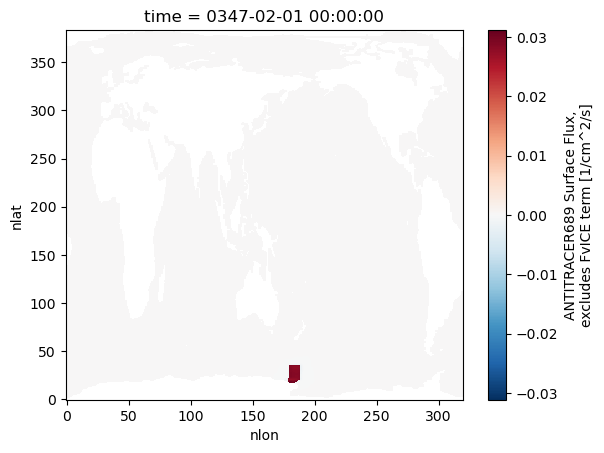

In [10]:
ds["STF_ANTITRACER689"].isel(time=0).plot()

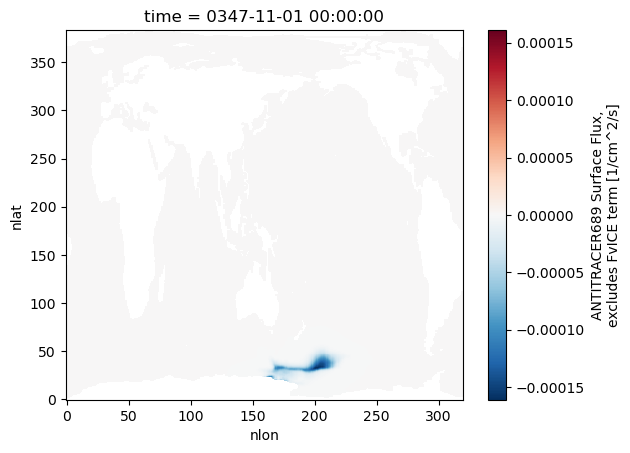

In [11]:
ds["STF_ANTITRACER689"].isel(time=-1).plot()

In [3]:
output_dir = "/global/cfs/cdirs/m4746/Users/nora/Ocean-CDR-Atlas-v0/data/archive/smyle.anti-tracer.glb-antitracer_1999-01_all.001/ocn/hist/"

In [4]:
ds = xr.open_mfdataset(f"{output_dir}/smyle.anti-tracer.glb-antitracer_1999-01_test.001.pop.h.0347-**.nc", decode_timedelta=False)

OSError: no files to open

In [20]:
ds

<xarray.Dataset> Size: 959MB
Dimensions:                 (time: 12, d2: 2, z_t: 60, z_w: 60, nlat: 384,
                             nlon: 320, z_t_150m: 15, z_w_top: 60, z_w_bot: 60)
Coordinates:
  * time                    (time) object 96B 0347-02-01 00:00:00 ... 0348-01...
  * z_t                     (z_t) float32 240B 500.0 1.5e+03 ... 5.375e+05
  * z_t_150m                (z_t_150m) float32 60B 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 240B 0.0 1e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 240B 0.0 1e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 240B 1e+03 2e+03 ... 5.5e+05
    ULONG                   (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 983kB dask.array<chunksize=(384, 320), meta=np.ndarray>
Dimensions without coordinates: d2, nlat, nlon
Data variables: (12/61)
    time_bound              (time, d2) object 192B dask.array<chunksize=(1, 2), meta=np.ndarray>
    dz                      (time, z_t) float32 3kB dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                     (time, z_w) float32 3kB dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                     (time, nlat, nlon) float64 12MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                     (time, nlat, nlon) float64 12MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    REGION_MASK             (time, nlat, nlon) float64 12MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ...                      ...
    ANTITRACER651_FORCING   (time, nlat, nlon) float32 6MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANTITRACER655_FORCING   (time, nlat, nlon) float32 6MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANTITRACER651           (time, z_t, nlat, nlon) float32 354MB dask.array<chunksize=(1, 60, 384, 320), meta=np.ndarray>
    STF_ANTITRACER651       (time, nlat, nlon) float32 6MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANTITRACER655           (time, z_t, nlat, nlon) float32 354MB dask.array<chunksize=(1, 60, 384, 320), meta=np.ndarray>
    STF_ANTITRACER655       (time, nlat, nlon) float32 6MB dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
Attributes:
    title:             smyle.anti-tracer.glb-antitracer_1999-01_test.001
    history:           none
    Conventions:       CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-cu...
    time_period_freq:  month_1
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    contents:          Diagnostic and Prognostic Variables
    source:            CCSM POP2, the CCSM Ocean Component
    revision:          $Id$
    calendar:          All years have exactly  365 days.
    start_time:        This dataset was created on 2025-11-07 at 12:20:38.0
    cell_methods:      cell_methods = time: mean ==> the variable values are ...

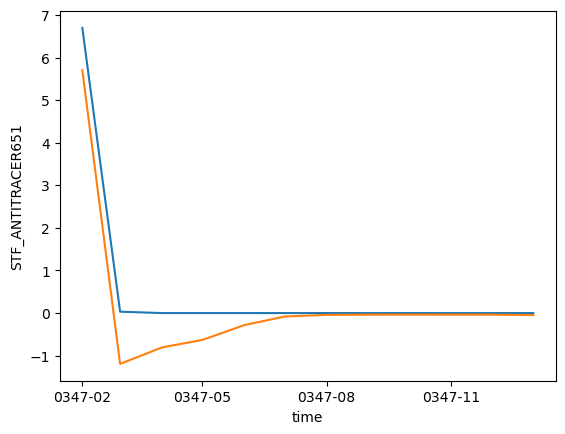

In [22]:
ds.ANTITRACER651_FORCING.sum(dim=["nlat", "nlon"]).plot()
ds.STF_ANTITRACER651.sum(dim=["nlat", "nlon"]).plot()


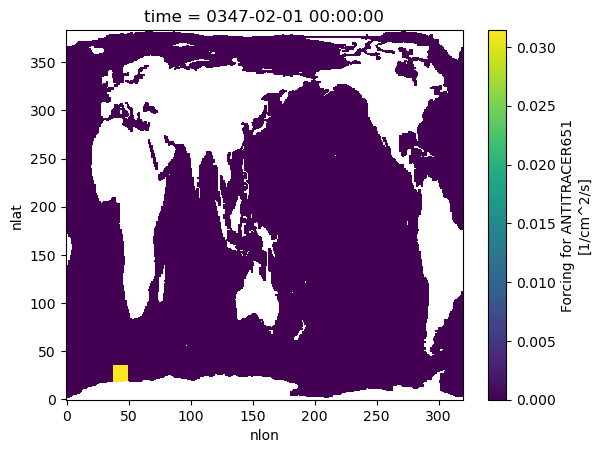

In [22]:
ds.ANTITRACER651_FORCING.isel(time=0).plot()

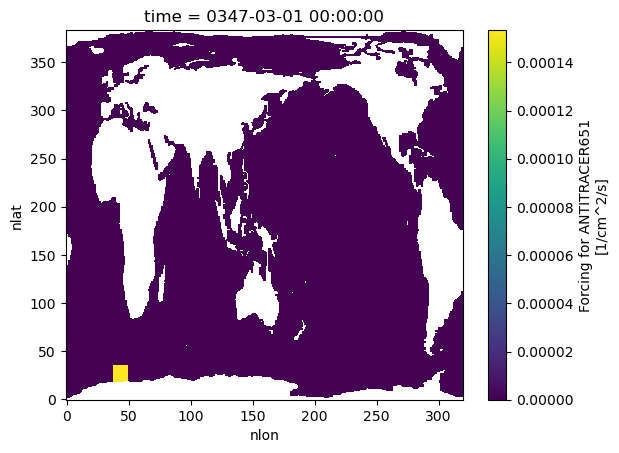

In [24]:
ds.ANTITRACER651_FORCING.isel(time=1).plot()

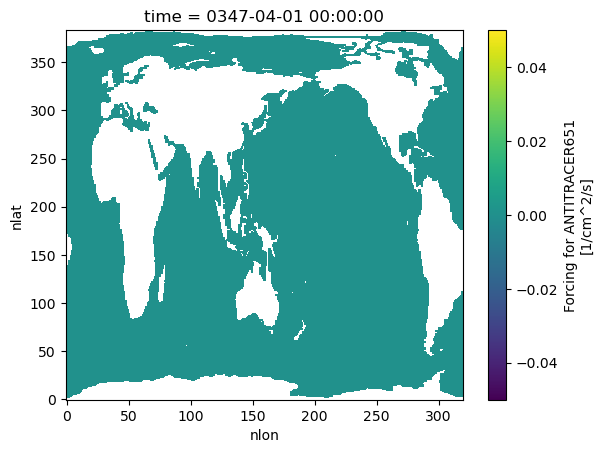

In [25]:
ds.ANTITRACER651_FORCING.isel(time=2).plot()

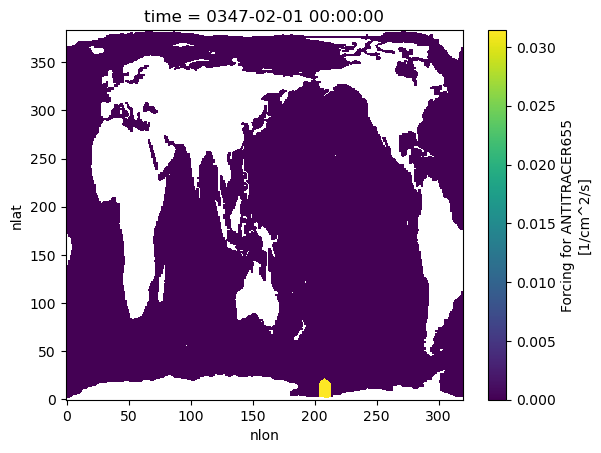

In [26]:
ds.ANTITRACER655_FORCING.isel(time=0).plot()

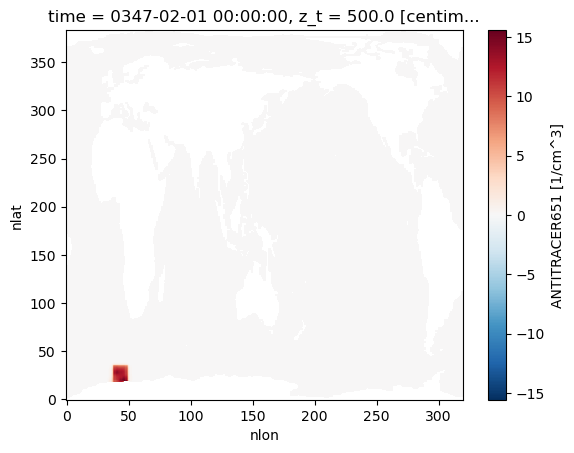

In [27]:
ds.ANTITRACER651.isel(time=0, z_t=0).plot()

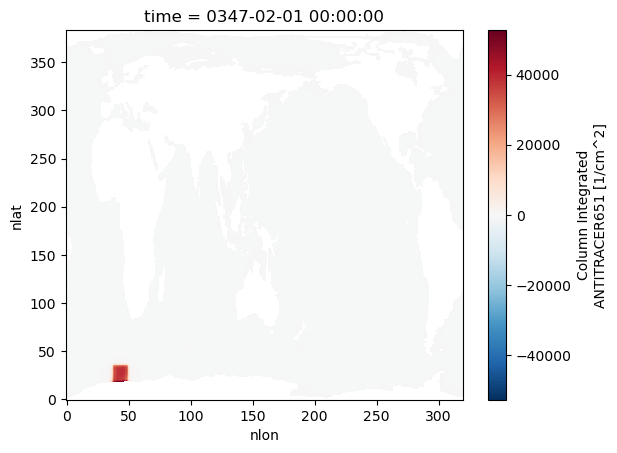

In [28]:
ds.ANTITRACER651_COL_INT.isel(time=0).plot()

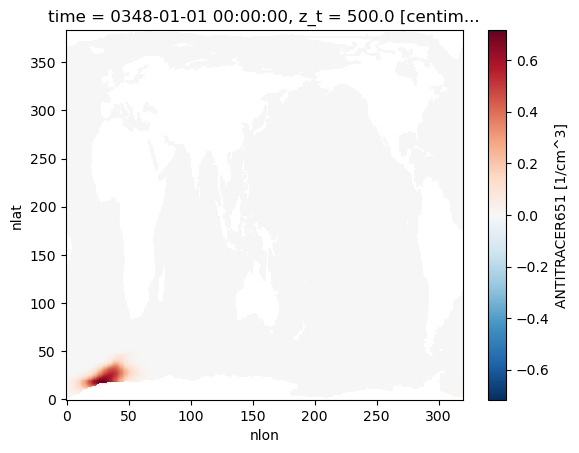

In [29]:
ds.ANTITRACER651.isel(time=-1, z_t=0).plot()

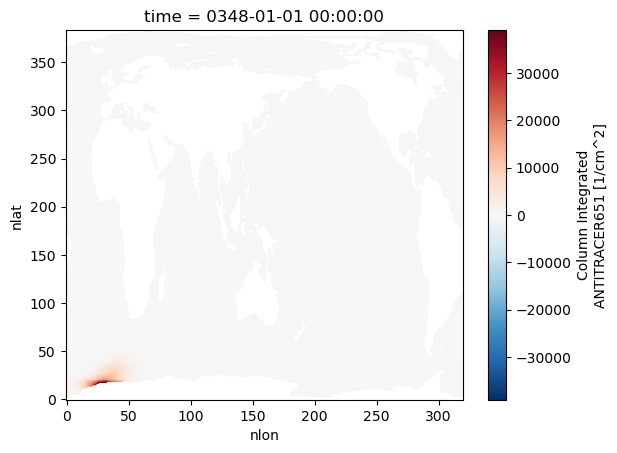

In [30]:
ds.ANTITRACER651_COL_INT.isel(time=-1).plot()

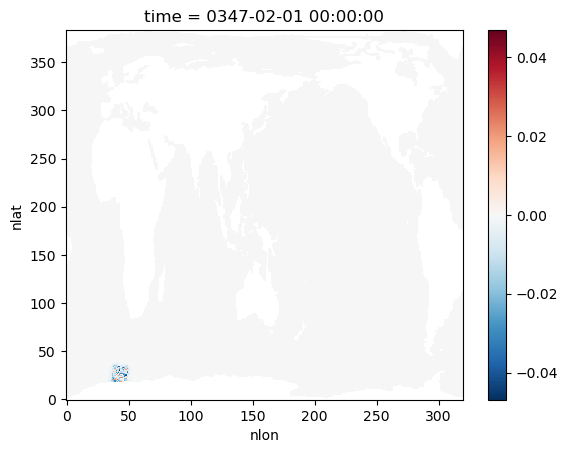

In [31]:
(ds.ANTITRACER651_COL_INT - (ds.ANTITRACER651 * ds.dz).sum(dim="z_t")).isel(time=0).plot()